<a href="https://colab.research.google.com/github/arielwendichansky/DI_Bootcamp/blob/master/Week7/Day3/Daily_challenge/Data_Cleaning_And_Transformation_With_Real_World_Datasets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [40]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats, cluster
from scipy.optimize import minimize_scalar
from scipy.stats import skew, kurtosis, median_test,ttest_ind, norm
from plotnine import (ggplot,aes,geom_line,facet_wrap,labs, scale_x_datetime, element_text, theme_538)
from plotnine.data import meat
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, f1_score, recall_score
from collections import Counter
from wordcloud import WordCloud, STOPWORDS

# Extract info Kaggle

In [ ]:
! pip install -k kaggle
from google.colab import files
files.upload()

In [3]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d START-UMD/gtd

In [ ]:
! unzip 'gtd.zip'

In [ ]:
df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')
df.head()

#Data inspection

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [8]:
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [9]:
df.dtypes

eventid        int64
iyear          int64
imonth         int64
iday           int64
approxdate    object
               ...  
INT_LOG        int64
INT_IDEO       int64
INT_MISC       int64
INT_ANY        int64
related       object
Length: 135, dtype: object

In [10]:
df.duplicated().sum()

0

In [ ]:
nulls = df.isnull().sum()
for values,name in nulls.items():
    print(name, values)


# Data Cleanig

In [12]:
columns_to_drop = ['approxdate','resolution','related','summary','scite1',	'scite2',	'scite3',	'dbsource',
                   'targtype2', 'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2', 'target2',
                   'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt', 'targsubtype3', 'targsubtype3_txt',
                   'corp3', 'target3', 'natlty3', 'natlty3_txt','gsubname', 'gname2', 'gsubname2', 'gname3', 'gsubname3',
                   'motive','claimmode_txt', 'claim2', 'claimmode2', 'claimmode2_txt', 'claim3', 'claimmode3', 'claimmode3_txt',
                   'weapsubtype1', 'weapsubtype1_txt', 'weaptype2', 'weaptype2_txt', 'weapsubtype2', 'weapsubtype2_txt',
                   'weaptype3', 'weaptype3_txt', 'weapsubtype3', 'weapsubtype3_txt', 'weaptype4', 'weaptype4_txt',
                   'weapsubtype4', 'weapsubtype4_txt','propcomment','addnotes','attacktype2', 'attacktype2_txt', 'attacktype3',
                   'attacktype3_txt','guncertain2', 'guncertain3'
]

cdata = df.copy()

In [13]:
cdata = cdata.drop(columns=columns_to_drop)

In [14]:
cdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 76 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   eventid             181691 non-null  int64  
 1   iyear               181691 non-null  int64  
 2   imonth              181691 non-null  int64  
 3   iday                181691 non-null  int64  
 4   extended            181691 non-null  int64  
 5   country             181691 non-null  int64  
 6   country_txt         181691 non-null  object 
 7   region              181691 non-null  int64  
 8   region_txt          181691 non-null  object 
 9   provstate           181270 non-null  object 
 10  city                181256 non-null  object 
 11  latitude            177135 non-null  float64
 12  longitude           177134 non-null  float64
 13  specificity         181685 non-null  float64
 14  vicinity            181691 non-null  int64  
 15  location            55495 non-null

In [15]:
cdata['nkill'].fillna(0, inplace=True)
cdata['nkill'] = cdata['nkill'].astype(int)

 # Exploratory Data Analysis

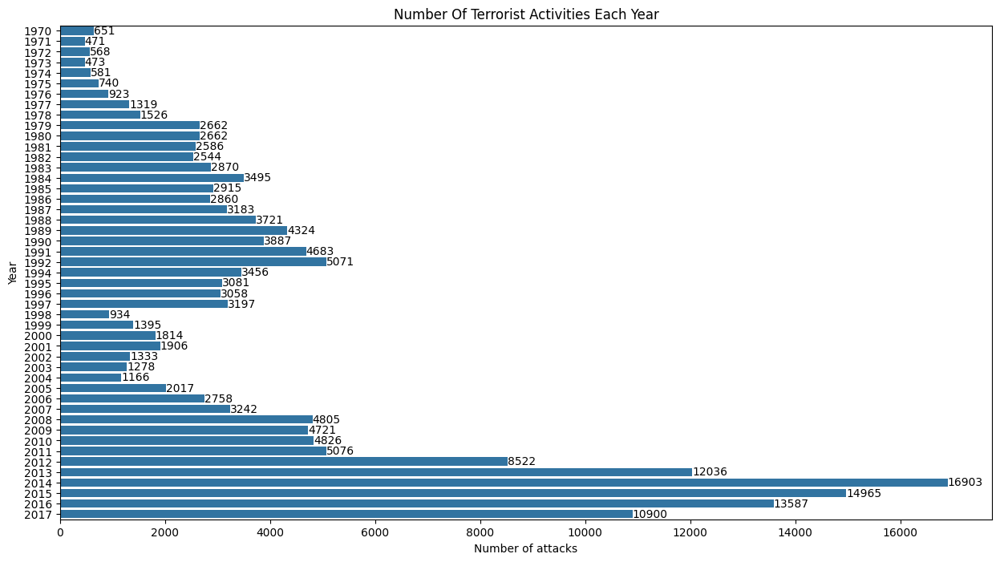

In [25]:
plt.figure(figsize=(15, 8))

ax=sns.countplot(y=cdata['iyear'])
ax.bar_label(ax.containers[0],label_type='edge')
plt.ylabel('Year')
plt.xlabel('Number of attacks')
plt.title('Number Of Terrorist Activities Each Year')

plt.show()

2013 was the year with the highest quantity of terrorist attacks. Furthermore, from 2010 in advance an increase can be seen.

In [28]:
attacks_by_month_day = cdata.groupby(['imonth', 'iday']).size().reset_index(name='attack_count')
attacks_by_month_day = attacks_by_month_day[attacks_by_month_day['imonth'] != 0]

fig = px.histogram(attacks_by_month_day, x='imonth', y='attack_count',
                   labels={'imonth': 'Month', 'attack_count': 'Number of Attacks'},
                   title='Distribution of Attacks by Month and Day',
                   histfunc='sum', orientation='v')

fig.update_layout(barmode='group', xaxis=dict(title='Month'), yaxis=dict(title='Attacks'))
fig.show()


During the month on May most of attacks are done.

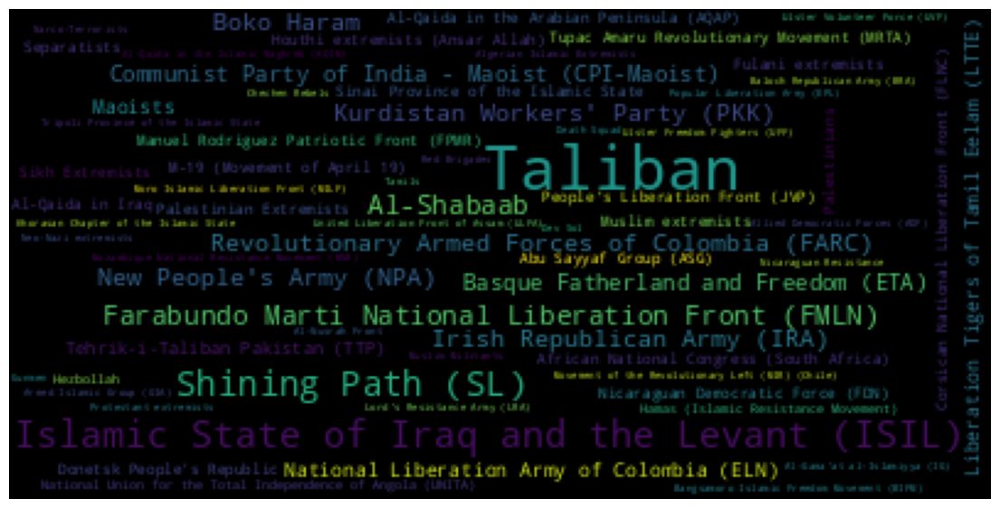

In [44]:
text_list = cdata['gname'].tolist()
word_could_dict=Counter(text_list)
word_could_dict.pop('Unknown')
wc = WordCloud()

# creating stopwords
stop_words = list(wc.stopwords)
custom_stop_words = ['Unknown']
stop_words = set(stop_words + custom_stop_words)

wc = WordCloud(stopwords=stop_words)

wc.generate_from_frequencies(word_could_dict)

fig = plt.figure(figsize=(14, 18))

# display the cloud
plt.imshow(wc)
plt.axis('off')
plt.show()

The plot clearly highlights some group or organization names with a higher count of attacks.

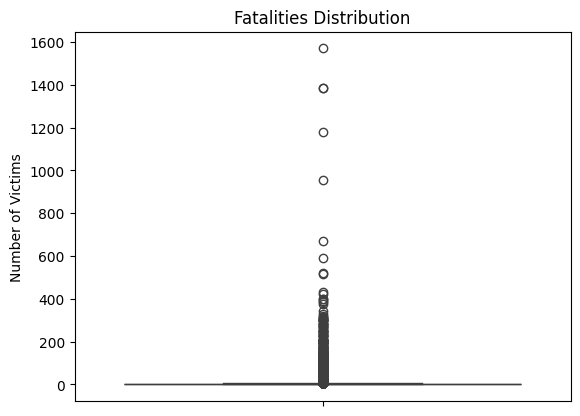

In [16]:
sns.boxplot(data=cdata, y='nkill').set(title='Fatalities Distribution')
plt.ylabel('Number of Victims')
plt.show()

Some of the attacks in the dataset have more than 1000 fatalities (e.g., the 9/11 attack), making them outliers compared to others. Due to this, we will filter out many of these outliers to work within a standard range.

In [17]:
cdata[cdata['nkill']>1000]

,eventid,iyear,imonth,iday,extended,country,country_txt,region,region_txt,provstate,...,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
55934,199404130008,1994,4,13,0,168,Rwanda,11,Sub-Saharan Africa,Kigali,...,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,1
73126,200109110004,2001,9,11,0,217,United States,1,North America,New York,...,NaN,NaN,NaN,4.0,Hostage(s) killed (not during rescue attempt),0.0,0,1,0,1
73127,200109110005,2001,9,11,0,217,United States,1,North America,New York,...,NaN,NaN,NaN,4.0,Hostage(s) killed (not during rescue attempt),0.0,0,1,0,1
133518,201406150063,2014,6,12,1,95,Iraq,10,Middle East & North Africa,Saladin,...,NaN,NaN,NaN,6.0,Combination,2.0,0,1,0,1


In [18]:
filtered_data = cdata[ (cdata['nkill']<400)]

print("Average murders by attack is:",int(filtered_data['nkill'].mean()))

Average murders by attack is: 2


As the mean of murders by attack is low, if we plot them in a boxplot it won't be clear to see the entire distribution.

In [19]:
fig=px.histogram(filtered_data, x='nkill', title='Fatalities Distribution')

fig.show()

In the dataset most of the attacks doesn't have 0 murders

In [20]:
no_murder_df = cdata[ (cdata['nkill']==0)]
print(f"There are {len(no_murder_df)} attacks with no fatalities")

There are 98462 attacks with no fatalities


In [21]:
unique_values = no_murder_df[['attacktype1', 'attacktype1_txt']].drop_duplicates()
unique_values_sorted = unique_values.sort_values(by='attacktype1')

print(unique_values_sorted)

     attacktype1                      attacktype1_txt
6              1                        Assassination
5              2                        Armed Assault
3              3                    Bombing/Explosion
12             4                            Hijacking
336            5  Hostage Taking (Barricade Incident)
1              6          Hostage Taking (Kidnapping)
4              7       Facility/Infrastructure Attack
298            8                      Unarmed Assault
39             9                              Unknown


The attack type field captures the general method of attack and often reflects the broad class of tactics used.

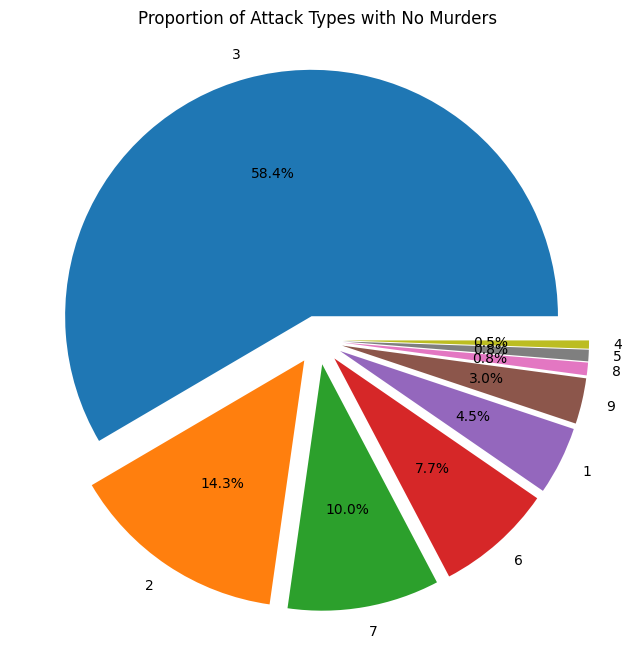

In [22]:
fig, ax = plt.subplots(figsize=(8,8))
explode = [0.1] * len(no_murder_df['attacktype1'].value_counts())
ax.pie(no_murder_df['attacktype1'].value_counts(), labels=no_murder_df['attacktype1'].value_counts().index, autopct='%1.1f%%', explode = explode)
ax.set_title('Proportion of Attack Types with No Murders')
plt.show()


Most of the attacks with no murders were Bombing/Explosion. Secondly, we have the Armed Assault. Third, Facility/Infrastructure Attack.

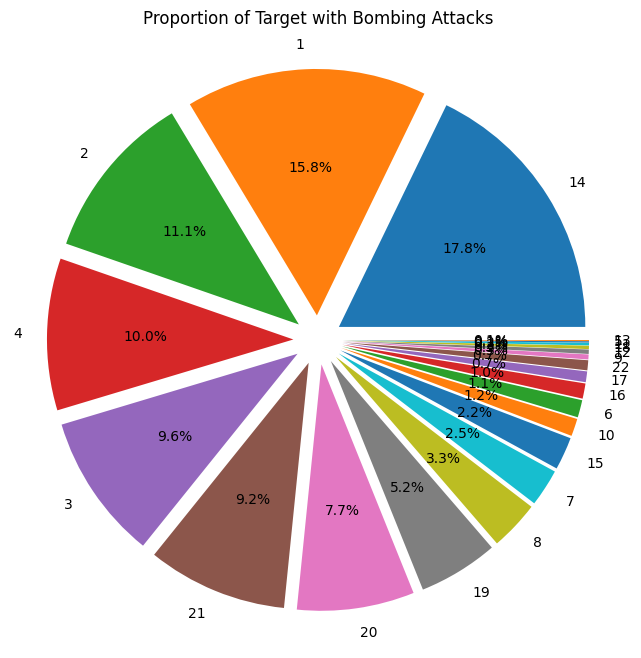

In [23]:
# Filtering those attacks where there were no kills and the attack type is equal to 3
no_murder_df = no_murder_df[no_murder_df['attacktype1']==3]

#PLotting the target from these attacks
fig, ax = plt.subplots(figsize=(8,8))
explode = [0.1] * len(no_murder_df['targtype1'].value_counts())
ax.pie(no_murder_df['targtype1'].value_counts(), labels=no_murder_df['targtype1'].value_counts().index, autopct='%1.1f%%', explode = explode)
ax.set_title('Proportion of Target with Bombing Attacks')
plt.show()

In [24]:
unique_values = no_murder_df[['targtype1', 'targtype1_txt']].drop_duplicates()
unique_values_sorted = unique_values.sort_values(by='targtype1')

print(unique_values_sorted)

      targtype1                   targtype1_txt
18            1                        Business
15            2            Government (General)
40            3                          Police
10            4                        Military
5891          5                Abortion Related
79            6             Airports & Aircraft
3             7         Government (Diplomatic)
17            8         Educational Institution
232           9            Food or Water Supply
437          10             Journalists & Media
907          11                        Maritime
179          12                             NGO
1702         13                           Other
28           14     Private Citizens & Property
35           15  Religious Figures/Institutions
219          16               Telecommunication
540          17    Terrorists/Non-State Militia
619          18                        Tourists
47           19                  Transportation
36           20                         

Most attacks involving bombings and no fatalities targeted Private Citizens & Property, followed by Business establishments, and then Government buildings or personnel.

In [26]:
# Counting the number of attacks by country
cdata["attack_count"] = cdata.groupby("country")["country"].transform("count")


In [99]:
fig = px.choropleth(cdata,
                    locations='country_txt',
                    locationmode='country names',
                    color='attack_count',
                    color_continuous_scale='Viridis',
                    range_color=(0, cdata['attack_count'].max()),
                    title="Attacks Worldwide",
                    hover_name='country_txt',
                    hover_data={'attack_count': True, 'country_txt': True},
                    labels={'attack_count': 'Number of Attacks'}
                   )
fig.update_geos(projection_type="orthographic", showcoastlines=True, coastlinecolor='Black',
                showland=True, landcolor='LightGreen', showocean=True)
fig.show()


In [38]:
# Select numeric columns
numeric_df = cdata.select_dtypes(include=['int64', 'float64'])

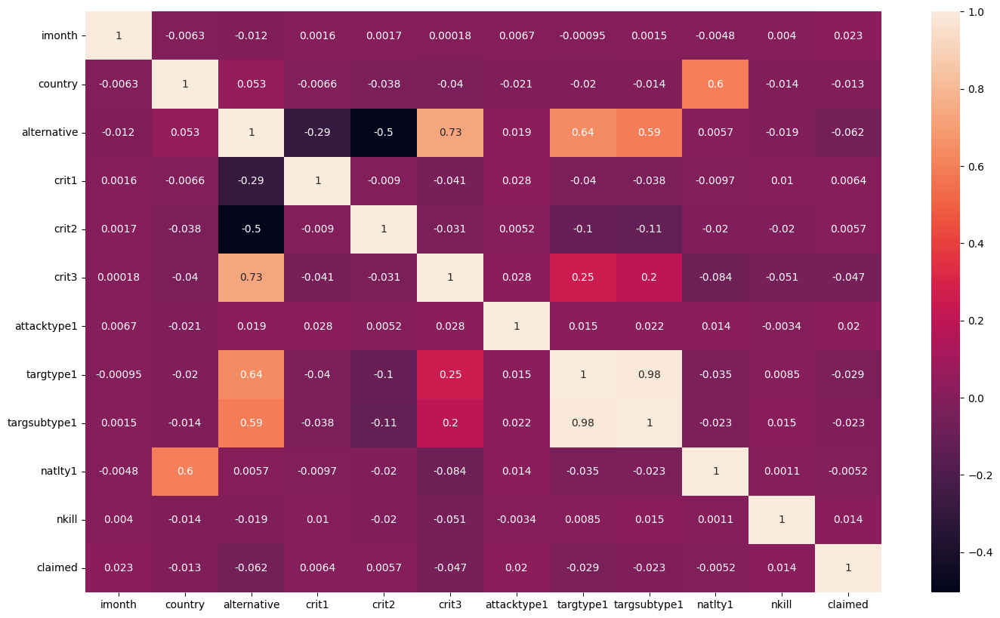

In [39]:
sns.heatmap(numeric_df[['imonth','country','alternative','crit1','crit2','crit3','attacktype1','targtype1','targsubtype1','natlty1','nkill','claimed',]].corr(),annot=True)

plt.rcParams['figure.figsize']=(17,10);

Alternative refers to cases marked as "Yes" for "Doubt Terrorism Proper?" This variable exhibits significant correlations with crit2 and crit3. crit2 denotes attacks intending to coerce, intimidate, or publicize to larger groups, showing a negative correlation with cases of doubt regarding terrorism. Conversely, crit3, representing actions outside legitimate warfare targeting non-combatants, shows a positive correlation. This suggests that cases of doubt are less likely to align with terrorism criteria but more likely to involve actions outside the context of warfare.

The nationality and country data indicate that the majority of attacks targeted citizens of the country where they occurred.



In [98]:
most_harmful = cdata.groupby('gname')['propvalue'].sum()
most_harmful = most_harmful[most_harmful > 0]

#taking Irish Republican Army (IRA) aside and unknown, cause it's an outlier
print(most_harmful[(most_harmful.index == 'Irish Republican Army (IRA)')])
most_harmful = most_harmful[(most_harmful.index != 'Irish Republican Army (IRA)') & (most_harmful.index != 'Unknown')]

most_harmful_sorted = most_harmful.sort_values(ascending=False)

#Selecting only top 10 organizations
top_10_most_harmful = most_harmful_sorted[1:11]

gname
Irish Republican Army (IRA)    4.098090e+09
Name: propvalue, dtype: float64
Series([], Name: propvalue, dtype: float64)


In [94]:
fig = px.bar(x=top_10_most_harmful.index, y=top_10_most_harmful.values, title='Top 10 Groups Total Damage to Properties (in USD)',
             labels={'x': 'Group Name', 'y': 'Total Damage (USD)'})

fig.show()


These are the terrorist organizations (after the IRA) that most damaged have caused in dollars.